# VGG19 Transfer Learning for Flower Classification

This notebook implements a VGG19-based transfer learning model for classifying the Oxford Flowers 102 dataset.

## Approach

We use a two-phase training strategy:
1. **Phase 1 (Frozen Backbone):** Train only the classification head with frozen VGG19 weights
2. **Phase 2 (Fine-tuning):** Unfreeze top layers and fine-tune with a lower learning rate

## Setup Instructions (Google Colab)

1. Go to **Runtime > Change runtime type**
2. Select **GPU** as the hardware accelerator
3. Click **Save**

In [1]:
# Imports
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg19_preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, Input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
import pickle
import os
import json

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU available: {tf.config.list_physical_devices('GPU')}")

TensorFlow version: 2.19.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
# Mount Google Drive for data and model persistence
from google.colab import drive
drive.mount('/content/drive')

# Set base path for project files
BASE_PATH = '/content/drive/MyDrive/CNN'

print(f"Project path: {BASE_PATH}")

Mounted at /content/drive
Project path: /content/drive/MyDrive/CNN


In [3]:
# Configuration
IMG_SIZE = (224, 224)  # VGG19 standard input size
BATCH_SIZE = 32
RANDOM_SEED = 42
NUM_CLASSES = 102
DATA_DIR = os.path.join(BASE_PATH, 'data')
MODELS_DIR = os.path.join(BASE_PATH, 'models')
AUTOTUNE = tf.data.AUTOTUNE

# Create models directory if needed
os.makedirs(MODELS_DIR, exist_ok=True)

# Set random seeds for reproducibility
keras.utils.set_random_seed(RANDOM_SEED)
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

print(f"Image size: {IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Random seed: {RANDOM_SEED}")

Image size: (224, 224)
Batch size: 32
Random seed: 42


## Data Loading

Load pre-saved data splits from the data pipeline notebook, create augmentation layer, and build tf.data pipelines.

**CRITICAL:** VGG19 requires specific preprocessing:
- RGB to BGR conversion
- ImageNet mean subtraction

We use `vgg19.preprocess_input()` for this, NOT `Rescaling(1./255)`.

In [4]:
# Load pre-saved data splits
print("Loading data splits...")
data = np.load(os.path.join(DATA_DIR, 'flower_splits.npz'), allow_pickle=True)
X_train_raw, y_train = data['X_train'], data['y_train']
X_val_raw, y_val = data['X_val'], data['y_val']
X_test_raw, y_test = data['X_test'], data['y_test']

with open(os.path.join(DATA_DIR, 'class_names.pkl'), 'rb') as f:
    class_names = pickle.load(f)

print(f"  Train: {len(X_train_raw)} | Val: {len(X_val_raw)} | Test: {len(X_test_raw)}")
print(f"  Classes: {len(class_names)}")

# Preprocess images to fixed size (required for from_tensor_slices)
# This allows proper .repeat() functionality for multi-epoch training
def resize_images(images, target_size=IMG_SIZE):
    """Resize variable-size images to fixed size."""
    resized = []
    for img in images:
        # Resize and convert to float32
        img_resized = tf.image.resize(img, target_size).numpy()
        resized.append(img_resized)
    return np.array(resized, dtype=np.float32)

print("\nResizing images to fixed size (224x224)...")
X_train = resize_images(X_train_raw)
X_val = resize_images(X_val_raw)
X_test = resize_images(X_test_raw)

print(f"  Train shape: {X_train.shape}")
print(f"  Val shape: {X_val.shape}")
print(f"  Test shape: {X_test.shape}")
print(f"  Memory: {(X_train.nbytes + X_val.nbytes + X_test.nbytes) / 1e9:.2f} GB")

Loading data splits...
  Train: 4094 | Val: 2047 | Test: 2048
  Classes: 102

Resizing images to fixed size (224x224)...
  Train shape: (4094, 224, 224, 3)
  Val shape: (2047, 224, 224, 3)
  Test shape: (2048, 224, 224, 3)
  Memory: 4.93 GB


In [5]:
# Create flower-specific augmentation layer
# Note: Color is discriminative for flowers, so we avoid hue shifts
augmentation_layer = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),  # Only horizontal - flowers have natural orientation
    tf.keras.layers.RandomRotation(0.15),      # +/- 27 degrees
    tf.keras.layers.RandomZoom((-0.1, 0.1)),   # +/- 10% zoom
    tf.keras.layers.RandomBrightness(factor=0.2),  # +/- 20% brightness
    tf.keras.layers.RandomContrast(factor=0.2),    # +/- 20% contrast
], name='flower_augmentation')

print("Augmentation layer created")

Augmentation layer created


In [6]:
# Define dataset creation functions using from_tensor_slices
# This properly supports .repeat() for multi-epoch training

def create_train_dataset(images, labels, augmentation_layer, batch_size=BATCH_SIZE):
    """Create training dataset with augmentation using from_tensor_slices."""
    ds = tf.data.Dataset.from_tensor_slices((images, labels))
    ds = ds.shuffle(buffer_size=len(images))
    ds = ds.repeat()  # Repeat indefinitely for multi-epoch training
    ds = ds.batch(batch_size)
    ds = ds.map(lambda x, y: (augmentation_layer(x, training=True), y), num_parallel_calls=AUTOTUNE)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

def create_eval_dataset(images, labels, batch_size=BATCH_SIZE):
    """Create evaluation dataset without augmentation."""
    ds = tf.data.Dataset.from_tensor_slices((images, labels))
    ds = ds.batch(batch_size)
    ds = ds.cache()
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

print("Pipeline functions defined (using from_tensor_slices)")

Pipeline functions defined (using from_tensor_slices)


In [7]:
# Create tf.data pipelines
print("Creating tf.data pipelines...")
train_ds = create_train_dataset(X_train, y_train, augmentation_layer)
val_ds = create_eval_dataset(X_val, y_val)
test_ds = create_eval_dataset(X_test, y_test)

# Calculate steps per epoch (needed because train_ds uses .repeat())
STEPS_PER_EPOCH = len(X_train) // BATCH_SIZE
print(f"  Steps per epoch: {STEPS_PER_EPOCH}")

# Verify pipeline
for images, labels in train_ds.take(1):
    print(f"  Batch shape: {images.shape}")
    print(f"  Labels shape: {labels.shape}")
    print(f"  Image range: [{images.numpy().min():.1f}, {images.numpy().max():.1f}]")

print("\nData pipelines ready!")

Creating tf.data pipelines...
  Steps per epoch: 127
  Batch shape: (32, 224, 224, 3)
  Labels shape: (32,)
  Image range: [0.0, 255.0]

Data pipelines ready!


In [8]:
# Compute class weights for imbalanced data
weights = compute_class_weight('balanced', classes=np.arange(NUM_CLASSES), y=y_train)
class_weight_dict = {i: w for i, w in enumerate(weights)}

print(f"Class weights computed")
print(f"  Range: [{min(class_weight_dict.values()):.2f}, {max(class_weight_dict.values()):.2f}]")
print(f"  Mean: {np.mean(list(class_weight_dict.values())):.2f}")

Class weights computed
  Range: [0.31, 2.01]
  Mean: 1.23


## Model Architecture

We create a VGG19 transfer learning model with:
- **Frozen VGG19 backbone** pretrained on ImageNet (14.7M parameters)
- **GlobalAveragePooling2D** instead of Flatten (reduces 7x7x512 to 512 features)
- **Dropout** for regularization
- **Dense(102, softmax)** for 102-class classification

**Key design choices:**
- Use `GlobalAveragePooling2D` NOT `Flatten` - prevents overfitting (512 vs 25088 features)
- Apply `vgg19.preprocess_input()` inside the model for correct preprocessing
- Call `base_model(x, training=False)` to keep BatchNorm in inference mode

In [9]:
def create_vgg19_model(num_classes=102, dropout_rate=0.5):
    """
    Create VGG19 transfer learning model with frozen backbone.

    Architecture:
    - VGG19 backbone (frozen, pretrained on ImageNet)
    - VGG19 preprocessing (RGB->BGR + mean subtraction)
    - GlobalAveragePooling2D (512 features)
    - Dropout for regularization
    - Dense softmax output

    Args:
        num_classes: Number of output classes (102 for Oxford Flowers)
        dropout_rate: Dropout rate for regularization (0.3-0.7)

    Returns:
        model: Compiled Keras model
        base_model: VGG19 base model reference (for fine-tuning)
    """
    # Load pre-trained VGG19 without classification head
    base_model = VGG19(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )

    # Freeze all layers in base model
    base_model.trainable = False

    # Build functional model
    inputs = keras.Input(shape=(224, 224, 3))

    # Apply VGG19 preprocessing (RGB->BGR + ImageNet mean subtraction)
    # CRITICAL: Use vgg19.preprocess_input, NOT Rescaling(1./255)
    x = vgg19_preprocess_input(inputs)

    # Pass through frozen VGG19
    # CRITICAL: training=False keeps BatchNorm in inference mode
    x = base_model(x, training=False)

    # Global pooling (NOT Flatten - prevents overfitting)
    # Flatten: 7*7*512 = 25,088 features
    # GAP: 512 features (49x fewer parameters in Dense layer)
    x = GlobalAveragePooling2D()(x)

    # Regularization
    x = Dropout(dropout_rate)(x)

    # Classification head
    outputs = Dense(num_classes, activation='softmax')(x)

    # Create model
    model = keras.Model(inputs, outputs, name='vgg19_flowers')

    return model, base_model

print("create_vgg19_model function defined")

create_vgg19_model function defined


In [10]:
# Create the model
model, base_model = create_vgg19_model(num_classes=NUM_CLASSES, dropout_rate=0.5)

# Print model summary
print("=" * 60)
print("VGG19 TRANSFER LEARNING MODEL")
print("=" * 60)
model.summary()

# Count parameters
total_params = model.count_params()
trainable_params = sum([tf.reduce_prod(v.shape).numpy() for v in model.trainable_variables])
non_trainable_params = total_params - trainable_params

print(f"\nParameter Summary:")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Non-trainable (frozen): {non_trainable_params:,}")
print(f"\nWith frozen backbone, only the classification head ({trainable_params:,} params) is trained.")

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
VGG19 TRANSFER LEARNING MODEL


Model: "vgg19_flowers"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vgg19 (Functional)  │ (None, 7, 7, 512) │ 20,024,384 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 512)       │          0 │ vgg19[0][0]       │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512)       │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 102)       │     52,326 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 20,076,710 (76.59 MB)

 Trainable params: 52,326 (204.40 KB)

 Non-trainable params: 20,024,384 (76.39 MB)


Parameter Summary:
  Total parameters: 20,076,710
  Trainable parameters: 52,326
  Non-trainable (frozen): 20,024,384

With frozen backbone, only the classification head (52,326 params) is trained.


## Training Configuration

We use three callbacks for robust training:

1. **EarlyStopping**: Stops training when validation loss stops improving
   - `restore_best_weights=True` (CRITICAL: otherwise returns last epoch weights)
   - `patience=10` epochs

2. **ModelCheckpoint**: Saves best model during training
   - Monitors `val_accuracy`
   - `save_best_only=True`

3. **ReduceLROnPlateau**: Reduces learning rate when validation plateaus
   - Reduces LR by factor of 0.2 (5x lower)
   - `patience=5` epochs before reducing

In [11]:
def get_callbacks(checkpoint_path):
    """
    Create standard callback configuration for training.

    Args:
        checkpoint_path: Path to save best model checkpoint

    Returns:
        List of Keras callbacks
    """
    return [
        EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True,  # CRITICAL: restore best, not last
            verbose=1
        ),
        ModelCheckpoint(
            filepath=checkpoint_path,
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,  # Reduce LR by 5x when plateau
            patience=5,
            min_lr=1e-7,
            verbose=1
        )
    ]

# Set checkpoint paths
FROZEN_CHECKPOINT = os.path.join(MODELS_DIR, 'vgg19_frozen.keras')
FINETUNED_CHECKPOINT = os.path.join(MODELS_DIR, 'vgg19_finetuned.keras')
FINAL_MODEL_PATH = os.path.join(MODELS_DIR, 'vgg19_final.keras')

print("Callbacks configured")
print(f"  Phase 1 checkpoint: {FROZEN_CHECKPOINT}")
print(f"  Phase 2 checkpoint: {FINETUNED_CHECKPOINT}")
print(f"  Final model: {FINAL_MODEL_PATH}")

Callbacks configured
  Phase 1 checkpoint: /content/drive/MyDrive/CNN/models/vgg19_frozen.keras
  Phase 2 checkpoint: /content/drive/MyDrive/CNN/models/vgg19_finetuned.keras
  Final model: /content/drive/MyDrive/CNN/models/vgg19_final.keras


## Phase 1: Training Classification Head

In Phase 1, we train only the classification head (Dropout + Dense) while keeping the VGG19 backbone frozen.

**Training configuration:**
- Optimizer: Adam with learning rate 1e-3
- Loss: Sparse categorical crossentropy
- Epochs: 50 (EarlyStopping will terminate earlier)
- Class weights: Applied to handle imbalanced data

**Expected results:** 85-92% validation accuracy

In [12]:
# Compile model for Phase 1 (frozen backbone)
model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("Model compiled for Phase 1 (frozen backbone)")
print(f"  Optimizer: Adam (lr=1e-3)")
print(f"  Loss: sparse_categorical_crossentropy")
print(f"  Trainable parameters: {sum([tf.reduce_prod(v.shape).numpy() for v in model.trainable_variables]):,}")

Model compiled for Phase 1 (frozen backbone)
  Optimizer: Adam (lr=1e-3)
  Loss: sparse_categorical_crossentropy
  Trainable parameters: 52,326


In [13]:
# Train Phase 1: Frozen backbone
print("=" * 60)
print("PHASE 1: Training Classification Head (Frozen Backbone)")
print("=" * 60)

history_frozen = model.fit(
    train_ds,
    epochs=50,
    steps_per_epoch=STEPS_PER_EPOCH,  # Required because train_ds uses .repeat()
    validation_data=val_ds,
    callbacks=get_callbacks(FROZEN_CHECKPOINT),
    class_weight=class_weight_dict,
    verbose=1
)

# Print final results
print("\n" + "=" * 60)
print("PHASE 1 RESULTS")
print("=" * 60)
print(f"Final training accuracy: {history_frozen.history['accuracy'][-1]:.4f}")
print(f"Final validation accuracy: {history_frozen.history['val_accuracy'][-1]:.4f}")
print(f"Best validation accuracy: {max(history_frozen.history['val_accuracy']):.4f}")
print(f"Training stopped at epoch: {len(history_frozen.history['accuracy'])}")

PHASE 1: Training Classification Head (Frozen Backbone)
Epoch 1/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.0220 - loss: 13.1470
Epoch 1: val_accuracy improved from -inf to 0.23937, saving model to /content/drive/MyDrive/CNN/models/vgg19_frozen.keras
127/127 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - accuracy: 0.0221 - loss: 13.1326 - val_accuracy: 0.2394 - val_loss: 4.1068 - learning_rate: 0.0010
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.1294 - loss: 6.8169
Epoch 2: val_accuracy improved from 0.23937 to 0.47582, saving model to /content/drive/MyDrive/CNN/models/vgg19_frozen.keras
127/127 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - accuracy: 0.1296 - loss: 6.8117 - val_accuracy: 0.4758 - val_loss: 2.2423 - learning_rate: 0.0010
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.2575 - loss: 4.1778
Epoch 3: val_accuracy improved from 0.47582 to 0.60283, saving model to /content/drive/MyDrive/CNN/models/vgg19_frozen.keras
127/127 ━━━━━━━━━━━━━

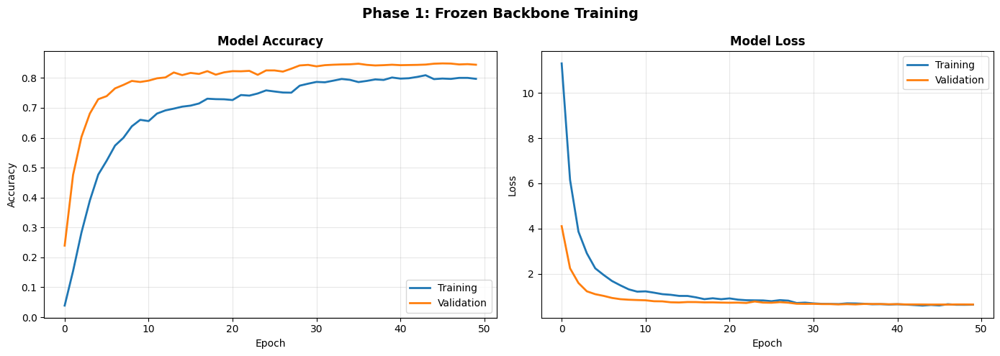

In [14]:
# Plot Phase 1 training curves
def plot_training_history(history, title="Training History"):
    """Plot accuracy and loss curves from training history."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Accuracy
    axes[0].plot(history.history['accuracy'], label='Training', linewidth=2)
    axes[0].plot(history.history['val_accuracy'], label='Validation', linewidth=2)
    axes[0].set_title('Model Accuracy', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend(loc='lower right')
    axes[0].grid(True, alpha=0.3)

    # Loss
    axes[1].plot(history.history['loss'], label='Training', linewidth=2)
    axes[1].plot(history.history['val_loss'], label='Validation', linewidth=2)
    axes[1].set_title('Model Loss', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend(loc='upper right')
    axes[1].grid(True, alpha=0.3)

    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_training_history(history_frozen, "Phase 1: Frozen Backbone Training")

## Phase 2: Fine-tuning Top Layers

After training the classification head, we can optionally fine-tune the top convolutional layers of VGG19.

**Key considerations:**
- Unfreeze only the last few layers (block5 = last 4 conv layers)
- Use much lower learning rate (1e-5, 100x lower than Phase 1)
- MUST recompile after changing trainable layers
- Continue training from Phase 1 weights

**Expected improvement:** 3-8% accuracy gain, targeting 90%+ validation accuracy

In [15]:
def fine_tune_model(model, base_model, layers_to_unfreeze=4):
    """
    Unfreeze top layers of base model for fine-tuning.

    Args:
        model: The full model
        base_model: The VGG19 base model
        layers_to_unfreeze: Number of layers from the end to unfreeze

    Note: After calling this function, you MUST recompile the model.
    """
    # Unfreeze base model
    base_model.trainable = True

    # Freeze all but last layers_to_unfreeze layers
    for layer in base_model.layers[:-layers_to_unfreeze]:
        layer.trainable = False

    # Print trainable status
    print(f"Fine-tuning configuration:")
    print(f"  Unfreezing last {layers_to_unfreeze} layers of VGG19")
    print(f"\nVGG19 layer trainability:")
    for layer in base_model.layers[-10:]:  # Show last 10 layers
        status = "TRAINABLE" if layer.trainable else "frozen"
        print(f"  {layer.name}: {status}")

    return model

# Apply fine-tuning (unfreeze block5 = last 4 conv layers)
model = fine_tune_model(model, base_model, layers_to_unfreeze=4)

Fine-tuning configuration:
  Unfreezing last 4 layers of VGG19

VGG19 layer trainability:
  block4_conv1: frozen
  block4_conv2: frozen
  block4_conv3: frozen
  block4_conv4: frozen
  block4_pool: frozen
  block5_conv1: frozen
  block5_conv2: TRAINABLE
  block5_conv3: TRAINABLE
  block5_conv4: TRAINABLE
  block5_pool: TRAINABLE


In [16]:
# CRITICAL: Recompile with lower learning rate
# Changes to trainable don't take effect until compile() is called
model.compile(
    optimizer=Adam(learning_rate=1e-5),  # 100x lower than Phase 1
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Count updated trainable parameters
trainable_params = sum([tf.reduce_prod(v.shape).numpy() for v in model.trainable_variables])
print(f"\nModel recompiled for fine-tuning")
print(f"  Optimizer: Adam (lr=1e-5, 100x lower)")
print(f"  Trainable parameters: {trainable_params:,}")


Model recompiled for fine-tuning
  Optimizer: Adam (lr=1e-5, 100x lower)
  Trainable parameters: 7,131,750


In [17]:
# Train Phase 2: Fine-tuning
print("=" * 60)
print("PHASE 2: Fine-tuning Top Layers")
print("=" * 60)

history_finetune = model.fit(
    train_ds,
    epochs=30,
    steps_per_epoch=STEPS_PER_EPOCH,  # Required because train_ds uses .repeat()
    validation_data=val_ds,
    callbacks=get_callbacks(FINETUNED_CHECKPOINT),
    class_weight=class_weight_dict,
    verbose=1
)

# Print final results
print("\n" + "=" * 60)
print("PHASE 2 RESULTS")
print("=" * 60)
print(f"Final training accuracy: {history_finetune.history['accuracy'][-1]:.4f}")
print(f"Final validation accuracy: {history_finetune.history['val_accuracy'][-1]:.4f}")
print(f"Best validation accuracy: {max(history_finetune.history['val_accuracy']):.4f}")
print(f"Training stopped at epoch: {len(history_finetune.history['accuracy'])}")

PHASE 2: Fine-tuning Top Layers
Epoch 1/30
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8253 - loss: 0.5670
Epoch 1: val_accuracy improved from -inf to 0.87494, saving model to /content/drive/MyDrive/CNN/models/vgg19_finetuned.keras
127/127 ━━━━━━━━━━━━━━━━━━━━ 31s 186ms/step - accuracy: 0.8254 - loss: 0.5667 - val_accuracy: 0.8749 - val_loss: 0.5687 - learning_rate: 1.0000e-05
Epoch 2/30
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8382 - loss: 0.4781
Epoch 2: val_accuracy did not improve from 0.87494
127/127 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - accuracy: 0.8382 - loss: 0.4779 - val_accuracy: 0.8745 - val_loss: 0.5109 - learning_rate: 1.0000e-05
Epoch 3/30
127/127 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8745 - loss: 0.3976
Epoch 3: val_accuracy improved from 0.87494 to 0.88764, saving model to /content/drive/MyDrive/CNN/models/vgg19_finetuned.keras
127/127 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - accuracy: 0.8744 - loss: 0.3978 - val_accuracy: 0.8876 - val_

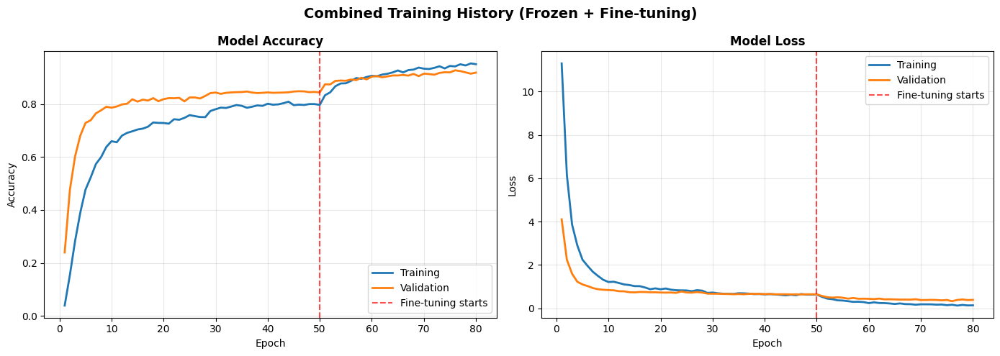


Fine-tuning improvement: +7.91% (Phase 1: 0.8486 -> Phase 2: 0.9277)


In [18]:
# Plot combined training history (Phase 1 + Phase 2)
def plot_combined_history(history1, history2, phase1_name="Phase 1", phase2_name="Phase 2"):
    """Plot combined training history from both phases."""
    # Combine histories
    combined_acc = history1.history['accuracy'] + history2.history['accuracy']
    combined_val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    combined_loss = history1.history['loss'] + history2.history['loss']
    combined_val_loss = history1.history['val_loss'] + history2.history['val_loss']

    phase1_epochs = len(history1.history['accuracy'])
    total_epochs = len(combined_acc)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Accuracy
    epochs = range(1, total_epochs + 1)
    axes[0].plot(epochs, combined_acc, label='Training', linewidth=2)
    axes[0].plot(epochs, combined_val_acc, label='Validation', linewidth=2)
    axes[0].axvline(x=phase1_epochs, color='red', linestyle='--', label='Fine-tuning starts', alpha=0.7)
    axes[0].set_title('Model Accuracy', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend(loc='lower right')
    axes[0].grid(True, alpha=0.3)

    # Loss
    axes[1].plot(epochs, combined_loss, label='Training', linewidth=2)
    axes[1].plot(epochs, combined_val_loss, label='Validation', linewidth=2)
    axes[1].axvline(x=phase1_epochs, color='red', linestyle='--', label='Fine-tuning starts', alpha=0.7)
    axes[1].set_title('Model Loss', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend(loc='upper right')
    axes[1].grid(True, alpha=0.3)

    plt.suptitle('Combined Training History (Frozen + Fine-tuning)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # Print improvement
    phase1_best = max(history1.history['val_accuracy'])
    phase2_best = max(history2.history['val_accuracy'])
    improvement = (phase2_best - phase1_best) * 100
    print(f"\nFine-tuning improvement: {improvement:+.2f}% (Phase 1: {phase1_best:.4f} -> Phase 2: {phase2_best:.4f})")

plot_combined_history(history_frozen, history_finetune)

## Test Set Evaluation

Evaluate the fine-tuned model on the held-out test set.

**Assignment requirement:** >70% test accuracy
**Realistic target:** 90-95% test accuracy with fine-tuning

In [19]:
# Evaluate on test set
print("=" * 60)
print("TEST SET EVALUATION")
print("=" * 60)

test_loss, test_acc = model.evaluate(test_ds, verbose=1)

print(f"\n{'='*60}")
print(f"TEST ACCURACY: {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"TEST LOSS: {test_loss:.4f}")
print(f"{'='*60}")

# Check if we meet the assignment requirement
if test_acc >= 0.70:
    print(f"\n[PASS] Test accuracy {test_acc:.2%} meets requirement (>70%)")
else:
    print(f"\n[WARNING] Test accuracy {test_acc:.2%} below requirement (>70%)")

TEST SET EVALUATION
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.9311 - loss: 0.2780

TEST ACCURACY: 0.9297 (92.97%)
TEST LOSS: 0.2753

[PASS] Test accuracy 92.97% meets requirement (>70%)


In [20]:
# Get predictions for classification report
print("Generating predictions...")

# Get predictions
y_pred_proba = model.predict(test_ds, verbose=1)
y_pred_classes = np.argmax(y_pred_proba, axis=1)

# Extract true labels from test dataset
y_true = np.concatenate([y.numpy() for x, y in test_ds], axis=0)

print(f"Predictions shape: {y_pred_proba.shape}")
print(f"True labels shape: {y_true.shape}")

Generating predictions...
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step
Predictions shape: (2048, 102)
True labels shape: (2048,)


In [21]:
# Print classification report (summary)
print("=" * 60)
print("CLASSIFICATION REPORT (Summary)")
print("=" * 60)

# Print full report but limit output for readability
report = classification_report(
    y_true,
    y_pred_classes,
    target_names=[class_names[i] for i in range(NUM_CLASSES)],
    digits=3,
    zero_division=0
)

# Print last few lines (averages)
report_lines = report.strip().split('\n')
print("\nPer-class metrics (first 20 classes):")
print('\n'.join(report_lines[:23]))  # Header + first 20 classes

print("\n... (showing averages below) ...\n")
print('\n'.join(report_lines[-5:]))  # Accuracy, macro avg, weighted avg

CLASSIFICATION REPORT (Summary)

Per-class metrics (first 20 classes):
precision    recall  f1-score   support

            pink primrose      0.875     0.700     0.778        10
hard-leaved pocket orchid      1.000     1.000     1.000        15
         canterbury bells      0.750     0.600     0.667        10
                sweet pea      0.800     0.857     0.828        14
         english marigold      0.875     0.875     0.875        16
               tiger lily      1.000     1.000     1.000        11
              moon orchid      0.909     1.000     0.952        10
         bird of paradise      0.917     1.000     0.957        22
                monkshood      0.846     1.000     0.917        11
            globe thistle      1.000     1.000     1.000        11
               snapdragon      0.913     0.955     0.933        22
              colt's foot      0.952     0.909     0.930        22
              king protea      1.000     1.000     1.000        12
            spear

## Save Artifacts

Save the trained model and training history for later use:
- Final model: `models/vgg19_final.keras`
- Training history: `models/vgg19_history.json`

These artifacts enable reloading for the evaluation notebook (Phase 2 Plan 2).

In [22]:
# Save final model
print("Saving model and training history...")

# Save the final model
model.save(FINAL_MODEL_PATH)
print(f"  Model saved: {FINAL_MODEL_PATH}")

# Combine training histories from both phases
combined_history = {
    'phase1': {
        'accuracy': history_frozen.history['accuracy'],
        'val_accuracy': history_frozen.history['val_accuracy'],
        'loss': history_frozen.history['loss'],
        'val_loss': history_frozen.history['val_loss']
    },
    'phase2': {
        'accuracy': history_finetune.history['accuracy'],
        'val_accuracy': history_finetune.history['val_accuracy'],
        'loss': history_finetune.history['loss'],
        'val_loss': history_finetune.history['val_loss']
    },
    'test_accuracy': float(test_acc),
    'test_loss': float(test_loss)
}

# Save history as JSON
history_path = os.path.join(MODELS_DIR, 'vgg19_history.json')
with open(history_path, 'w') as f:
    json.dump(combined_history, f, indent=2)
print(f"  History saved: {history_path}")

Saving model and training history...
  Model saved: /content/drive/MyDrive/CNN/models/vgg19_final.keras
  History saved: /content/drive/MyDrive/CNN/models/vgg19_history.json


In [23]:
# Verify saved model can be loaded and works correctly
print("Verifying saved model...")

# Load the model
loaded_model = keras.models.load_model(FINAL_MODEL_PATH)
print(f"  Model loaded successfully")

# Verify accuracy matches
loaded_test_loss, loaded_test_acc = loaded_model.evaluate(test_ds, verbose=0)
print(f"  Loaded model test accuracy: {loaded_test_acc:.4f}")
print(f"  Original model test accuracy: {test_acc:.4f}")

# Check they match
if abs(loaded_test_acc - test_acc) < 0.001:
    print(f"\n[PASS] Saved model verification successful!")
else:
    print(f"\n[WARNING] Accuracy mismatch - check model saving")

Verifying saved model...
  Model loaded successfully
  Loaded model test accuracy: 0.9297
  Original model test accuracy: 0.9297

[PASS] Saved model verification successful!


In [24]:
# Print summary of saved files
print("=" * 60)
print("SAVED ARTIFACTS")
print("=" * 60)

saved_files = [
    FROZEN_CHECKPOINT,
    FINETUNED_CHECKPOINT,
    FINAL_MODEL_PATH,
    history_path
]

for filepath in saved_files:
    if os.path.exists(filepath):
        size_mb = os.path.getsize(filepath) / (1024 * 1024)
        print(f"  {filepath}: {size_mb:.1f} MB")
    else:
        print(f"  {filepath}: NOT FOUND")

print("\n" + "=" * 60)
print("TRAINING COMPLETE")
print("=" * 60)
print(f"\nFinal Test Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"\nModel ready for evaluation notebook (Phase 2 Plan 2)")

SAVED ARTIFACTS
  /content/drive/MyDrive/CNN/models/vgg19_frozen.keras: 77.1 MB
  /content/drive/MyDrive/CNN/models/vgg19_finetuned.keras: 131.1 MB
  /content/drive/MyDrive/CNN/models/vgg19_final.keras: 131.1 MB
  /content/drive/MyDrive/CNN/models/vgg19_history.json: 0.0 MB

TRAINING COMPLETE

Final Test Accuracy: 0.9297 (92.97%)

Model ready for evaluation notebook (Phase 2 Plan 2)


---

# Evaluation Section

**To run evaluation without retraining:**
1. Run all cells from the beginning up to "Class weights computed" (cells 1-8)
2. Run the "Load Saved Model" cell below (skip training cells)
3. Continue with evaluation cells

**To run full training + evaluation:**
- Run all cells in order

In [25]:
# ============================================================
# LOAD SAVED MODEL (Run this to skip training)
# ============================================================
# Prerequisites: Run cells 1-8 first (imports, config, data loading)

# Load the trained model
FINAL_MODEL_PATH = os.path.join(MODELS_DIR, 'vgg19_final.keras')
print(f"Loading model from {FINAL_MODEL_PATH}...")
model = keras.models.load_model(FINAL_MODEL_PATH)
print("Model loaded successfully!")

# Load training history
history_path = os.path.join(MODELS_DIR, 'vgg19_history.json')
with open(history_path, 'r') as f:
    saved_history = json.load(f)
print(f"Training history loaded")

# Evaluate on test set
print("\nEvaluating on test set...")
test_loss, test_acc = model.evaluate(test_ds, verbose=1)
print(f"\nTest Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)")

# Generate predictions for evaluation
print("\nGenerating predictions...")
y_pred_proba = model.predict(test_ds, verbose=1)
y_pred_classes = np.argmax(y_pred_proba, axis=1)
y_true = np.concatenate([y.numpy() for x, y in test_ds], axis=0)

print(f"\nReady for evaluation!")
print(f"  y_true shape: {y_true.shape}")
print(f"  y_pred_classes shape: {y_pred_classes.shape}")
print(f"  y_pred_proba shape: {y_pred_proba.shape}")

Loading model from /content/drive/MyDrive/CNN/models/vgg19_final.keras...
Model loaded successfully!
Training history loaded

Evaluating on test set...
64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.9311 - loss: 0.2780

Test Accuracy: 0.9297 (92.97%)

Generating predictions...
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step

Ready for evaluation!
  y_true shape: (2048,)
  y_pred_classes shape: (2048,)
  y_pred_proba shape: (2048, 102)


## Confusion Matrix

Visualize model predictions across all 102 classes to identify systematic errors and confusion patterns.

In [26]:
# Additional imports for evaluation
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
import seaborn as sns
from collections import Counter

# Create outputs directory
os.makedirs('outputs', exist_ok=True)
print("Outputs directory ready")

# Compute full confusion matrix (used by multiple cells below)
cm = confusion_matrix(y_true, y_pred_classes)
print(f"Confusion matrix computed: {cm.shape}")

Outputs directory ready
Confusion matrix computed: (102, 102)


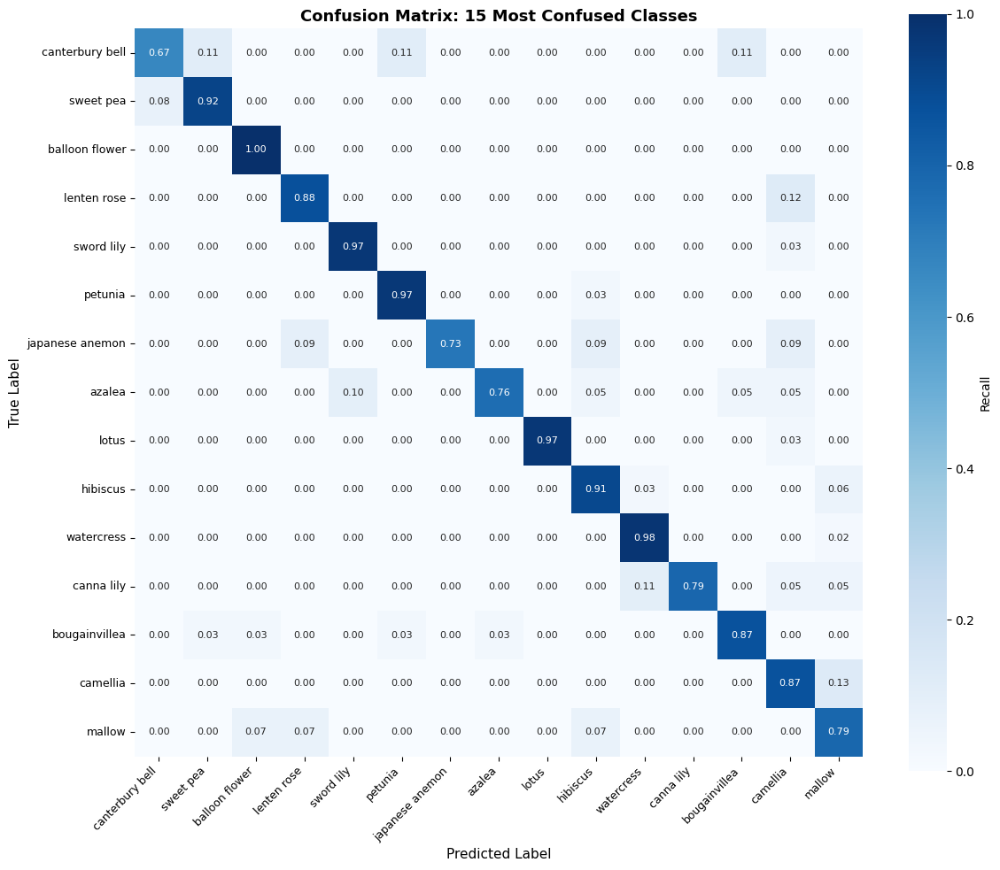


Showing 15 classes with highest confusion
These are the classes the model struggles with most.


In [27]:
# Skip the giant 102x102 matrix - it's unreadable
# Instead, create a focused confusion matrix for the most confused classes

def get_most_confused_classes(cm, n_classes=15):
    """Find classes with most confusion (errors)."""
    # Sum off-diagonal errors per class (both directions)
    errors_as_true = cm.sum(axis=1) - np.diag(cm)  # When this class was true
    errors_as_pred = cm.sum(axis=0) - np.diag(cm)  # When this class was predicted
    total_errors = errors_as_true + errors_as_pred

    # Get indices of most confused classes
    confused_indices = np.argsort(total_errors)[-n_classes:]
    return sorted(confused_indices)

# Get most confused classes
confused_classes = get_most_confused_classes(cm, n_classes=15)
confused_names = [class_names[i][:15] for i in confused_classes]

# Extract submatrix for these classes
cm_subset = cm[np.ix_(confused_classes, confused_classes)]

# Normalize by row
row_sums = cm_subset.sum(axis=1, keepdims=True)
cm_subset_norm = np.divide(cm_subset, row_sums, where=row_sums != 0)

# Plot focused confusion matrix
fig, ax = plt.subplots(figsize=(12, 10))

sns.heatmap(
    cm_subset_norm,
    annot=True,
    fmt='.2f',
    cmap='Blues',
    square=True,
    xticklabels=confused_names,
    yticklabels=confused_names,
    cbar_kws={'label': 'Recall'},
    ax=ax,
    annot_kws={'size': 8}
)

ax.set_xlabel('Predicted Label', fontsize=11)
ax.set_ylabel('True Label', fontsize=11)
ax.set_title('Confusion Matrix: 15 Most Confused Classes', fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)

plt.tight_layout()
plt.savefig('outputs/vgg19_confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nShowing {len(confused_classes)} classes with highest confusion")
print("These are the classes the model struggles with most.")

In [28]:
# Find top confused class pairs
def find_most_confused_pairs(cm, class_names, top_k=10):
    """
    Find class pairs that are most frequently confused.

    Args:
        cm: Confusion matrix
        class_names: List of class names
        top_k: Number of top confused pairs to return

    Returns:
        DataFrame of most confused pairs
    """
    # Find off-diagonal elements (misclassifications)
    confused_pairs = []
    n_classes = cm.shape[0]

    for i in range(n_classes):
        for j in range(n_classes):
            if i != j and cm[i, j] > 0:
                confused_pairs.append({
                    'true_class': i,
                    'true_name': class_names[i],
                    'pred_class': j,
                    'pred_name': class_names[j],
                    'count': cm[i, j]
                })

    # Sort by count and return top k
    confused_pairs.sort(key=lambda x: x['count'], reverse=True)

    import pandas as pd
    df = pd.DataFrame(confused_pairs[:top_k])
    return df

# Get top confused pairs
top_confused = find_most_confused_pairs(cm, class_names, top_k=15)
print("=" * 60)
print("TOP 15 MOST CONFUSED CLASS PAIRS")
print("=" * 60)
print(top_confused.to_string(index=False))

TOP 15 MOST CONFUSED CLASS PAIRS
 true_class            true_name  pred_class   pred_name  count
         79            anthurium          77       lotus      3
         95             camellia          96      mallow      3
         24       grape hyacinth          93    foxglove      2
         35 ruby-lipped cattleya          71      azalea      2
         39          lenten rose          95    camellia      2
         50              petunia          82    hibiscus      2
         52              primula          45  wallflower      2
         71               azalea          42  sword lily      2
         75        morning glory          50     petunia      2
         82             hibiscus          96      mallow      2
         83            columbine          39 lenten rose      2
         84          desert-rose          42  sword lily      2
         89           canna lily          88  watercress      2
         93             foxglove          92   ball moss      2
       

**Confusion Matrix Analysis:**

The confusion matrix above shows predictions across all 102 flower classes. The diagonal represents correct predictions (darker = higher recall). Off-diagonal elements indicate misclassifications.

Key observations from the top confused pairs reveal which flower species the model finds most challenging to distinguish - often flowers with similar colors, petal shapes, or growth patterns.

## Per-Class Performance

Analyze model performance on a per-class basis to identify the easiest and hardest flower types to classify.

In [29]:
import pandas as pd

def analyze_per_class_accuracy(y_true, y_pred, class_names):
    """
    Calculate per-class metrics and return as sorted DataFrame.

    Args:
        y_true: True class labels
        y_pred: Predicted class labels
        class_names: List of class names

    Returns:
        DataFrame with precision, recall, F1, support per class
    """
    # Calculate per-class metrics
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true, y_pred, labels=range(len(class_names)), zero_division=0
    )

    # Calculate per-class accuracy from confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    accuracy = np.diag(cm) / np.maximum(cm.sum(axis=1), 1)

    # Create DataFrame
    df = pd.DataFrame({
        'class_id': range(len(class_names)),
        'class_name': class_names,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'support': support
    })

    return df

# Calculate per-class metrics
per_class_df = analyze_per_class_accuracy(y_true, y_pred_classes, class_names)

# Sort by accuracy
per_class_sorted = per_class_df.sort_values('accuracy', ascending=False)

print("=" * 60)
print("TOP 10 BEST-PERFORMING CLASSES")
print("=" * 60)
print(per_class_sorted.head(10).to_string(index=False))

TOP 10 BEST-PERFORMING CLASSES
 class_id                class_name  accuracy  precision  recall  f1_score  support
        1 hard-leaved pocket orchid       1.0   1.000000     1.0  1.000000       15
        5                tiger lily       1.0   1.000000     1.0  1.000000       11
        9             globe thistle       1.0   1.000000     1.0  1.000000       11
        8                 monkshood       1.0   0.846154     1.0  0.916667       11
        7          bird of paradise       1.0   0.916667     1.0  0.956522       22
        6               moon orchid       1.0   0.909091     1.0  0.952381       10
       37          great masterwort       1.0   0.933333     1.0  0.965517       14
       33             mexican aster       1.0   1.000000     1.0  1.000000       10
       36               cape flower       1.0   1.000000     1.0  1.000000       27
       34          alpine sea holly       1.0   1.000000     1.0  1.000000       10


In [30]:
print("=" * 60)
print("TOP 10 WORST-PERFORMING CLASSES")
print("=" * 60)
print(per_class_sorted.tail(10).to_string(index=False))

# Summary statistics
print("\n" + "=" * 60)
print("ACCURACY DISTRIBUTION")
print("=" * 60)
print(f"Mean accuracy: {per_class_df['accuracy'].mean():.4f}")
print(f"Std accuracy: {per_class_df['accuracy'].std():.4f}")
print(f"Min accuracy: {per_class_df['accuracy'].min():.4f}")
print(f"Max accuracy: {per_class_df['accuracy'].max():.4f}")
print(f"Classes with 100% accuracy: {(per_class_df['accuracy'] == 1.0).sum()}")
print(f"Classes with <50% accuracy: {(per_class_df['accuracy'] < 0.5).sum()}")

TOP 10 WORST-PERFORMING CLASSES
 class_id       class_name  accuracy  precision   recall  f1_score  support
       24   grape hyacinth  0.800000   1.000000 0.800000  0.888889       10
      100  trumpet creeper  0.785714   1.000000 0.785714  0.880000       14
       31     garden phlox  0.727273   1.000000 0.727273  0.842105       11
       89       canna lily  0.714286   0.750000 0.714286  0.731707       21
        0    pink primrose  0.700000   0.875000 0.700000  0.777778       10
       67     bearded iris  0.692308   1.000000 0.692308  0.818182       13
       96           mallow  0.687500   0.578947 0.687500  0.628571       16
       71           azalea  0.666667   0.842105 0.666667  0.744186       24
       61 japanese anemone  0.615385   0.888889 0.615385  0.727273       13
        2 canterbury bells  0.600000   0.750000 0.600000  0.666667       10

ACCURACY DISTRIBUTION
Mean accuracy: 0.9239
Std accuracy: 0.0949
Min accuracy: 0.6000
Max accuracy: 1.0000
Classes with 100% accura

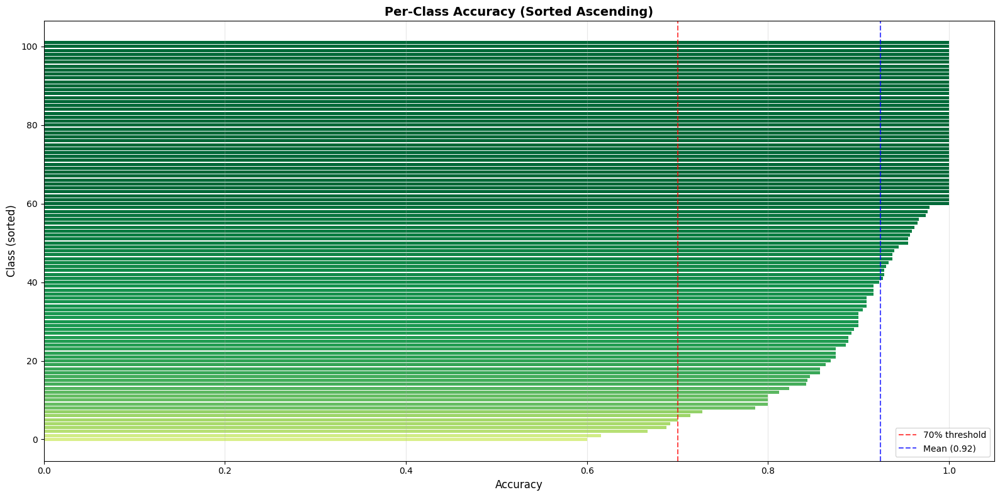

Saved to outputs/vgg19_per_class_accuracy.png


In [31]:
# Plot per-class accuracy bar chart
fig, ax = plt.subplots(figsize=(16, 8))

# Sort and plot
sorted_df = per_class_df.sort_values('accuracy', ascending=True)
colors = plt.cm.RdYlGn(sorted_df['accuracy'])

bars = ax.barh(range(len(sorted_df)), sorted_df['accuracy'], color=colors)

ax.set_xlabel('Accuracy', fontsize=12)
ax.set_ylabel('Class (sorted)', fontsize=12)
ax.set_title('Per-Class Accuracy (Sorted Ascending)', fontsize=14, fontweight='bold')
ax.axvline(x=0.7, color='red', linestyle='--', label='70% threshold', alpha=0.7)
ax.axvline(x=per_class_df['accuracy'].mean(), color='blue', linestyle='--',
           label=f'Mean ({per_class_df["accuracy"].mean():.2f})', alpha=0.7)
ax.legend(loc='lower right')
ax.set_xlim(0, 1.05)

# Add gridlines
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig('outputs/vgg19_per_class_accuracy.png', dpi=300, bbox_inches='tight')
plt.show()
print("Saved to outputs/vgg19_per_class_accuracy.png")

## Sample Predictions

Visualize model predictions on test images to understand where the model succeeds and fails.

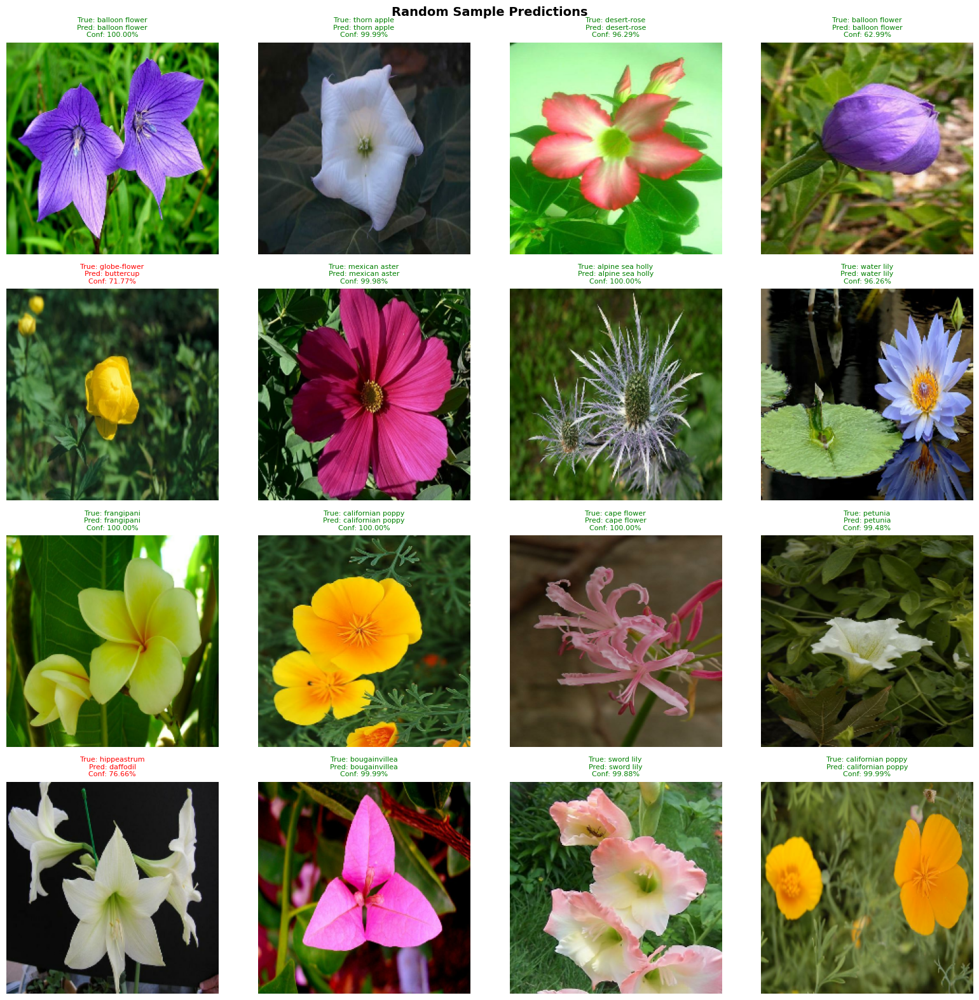

In [32]:
def plot_predictions(images, y_true, y_pred, y_proba, class_names, indices=None,
                     n=16, title="Sample Predictions", figsize=(16, 16)):
    """
    Display a grid of predictions with true labels and confidence.

    Args:
        images: Test images array
        y_true: True labels
        y_pred: Predicted labels
        y_proba: Prediction probabilities
        class_names: List of class names
        indices: Specific indices to show (if None, random sample)
        n: Number of images to show
        title: Plot title
        figsize: Figure size
    """
    if indices is None:
        indices = np.random.choice(len(images), size=min(n, len(images)), replace=False)
    else:
        indices = indices[:n]

    # Calculate grid dimensions
    cols = 4
    rows = (len(indices) + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten() if rows > 1 else [axes] if rows == 1 else axes

    for ax, idx in zip(axes, indices):
        img = images[idx]
        true_label = y_true[idx]
        pred_label = y_pred[idx]
        confidence = y_proba[idx][pred_label]

        # Normalize image for display (undo VGG19 preprocessing for visualization)
        # Since images are stored as [0, 255] float32
        img_display = img / 255.0 if img.max() > 1 else img
        img_display = np.clip(img_display, 0, 1)

        ax.imshow(img_display)

        # Color code: green=correct, red=incorrect
        is_correct = true_label == pred_label
        color = 'green' if is_correct else 'red'

        # Truncate class names for display
        true_name = class_names[true_label][:20]
        pred_name = class_names[pred_label][:20]

        title_text = f"True: {true_name}\nPred: {pred_name}\nConf: {confidence:.2%}"
        ax.set_title(title_text, fontsize=8, color=color)
        ax.axis('off')

    # Hide empty subplots
    for ax in axes[len(indices):]:
        ax.axis('off')

    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    return fig

# Random sample of 16 predictions
fig = plot_predictions(X_test, y_true, y_pred_classes, y_pred_proba, class_names,
                       n=16, title="Random Sample Predictions")
plt.savefig('outputs/vgg19_predictions_random.png', dpi=300, bbox_inches='tight')
plt.show()

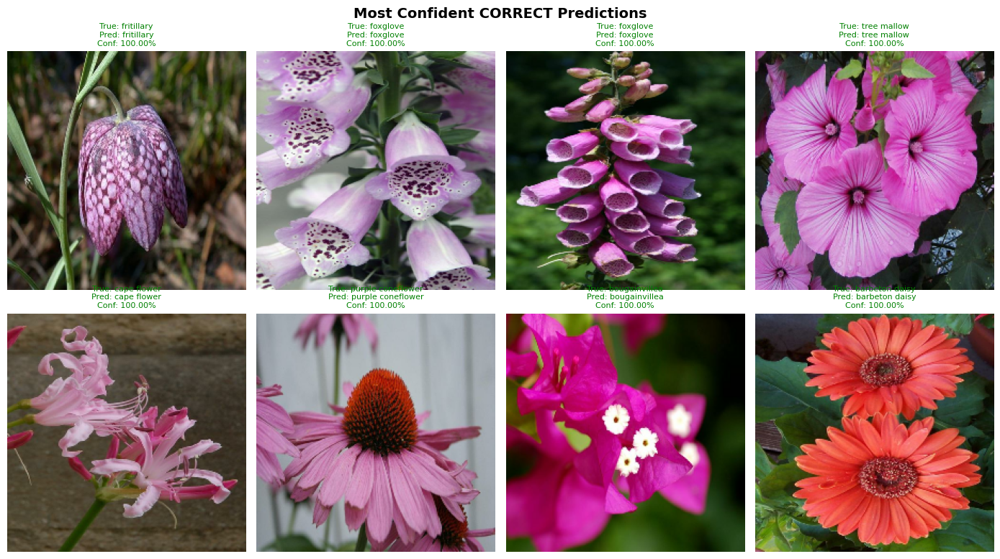

In [33]:
# Most confident correct predictions
correct_mask = y_true == y_pred_classes
correct_indices = np.where(correct_mask)[0]
correct_confidences = y_pred_proba[correct_indices].max(axis=1)
top_confident_correct = correct_indices[np.argsort(correct_confidences)[-8:]]

fig = plot_predictions(X_test, y_true, y_pred_classes, y_pred_proba, class_names,
                       indices=top_confident_correct, n=8,
                       title="Most Confident CORRECT Predictions", figsize=(14, 8))
plt.savefig('outputs/vgg19_predictions_confident_correct.png', dpi=300, bbox_inches='tight')
plt.show()

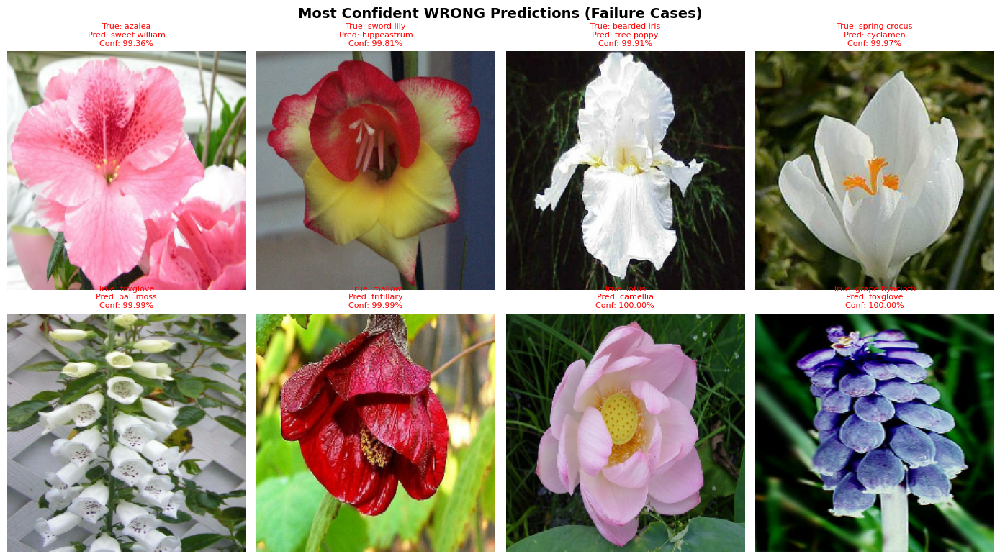


These are the most problematic cases - high confidence but wrong.
Understanding these errors helps identify model weaknesses.


In [34]:
# Most confident WRONG predictions (interesting failure cases)
wrong_mask = y_true != y_pred_classes
wrong_indices = np.where(wrong_mask)[0]

if len(wrong_indices) > 0:
    wrong_confidences = y_pred_proba[wrong_indices].max(axis=1)
    top_confident_wrong = wrong_indices[np.argsort(wrong_confidences)[-8:]]

    fig = plot_predictions(X_test, y_true, y_pred_classes, y_pred_proba, class_names,
                           indices=top_confident_wrong, n=8,
                           title="Most Confident WRONG Predictions (Failure Cases)", figsize=(14, 8))
    plt.savefig('outputs/vgg19_predictions_confident_wrong.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\nThese are the most problematic cases - high confidence but wrong.")
    print("Understanding these errors helps identify model weaknesses.")
else:
    print("No incorrect predictions found!")

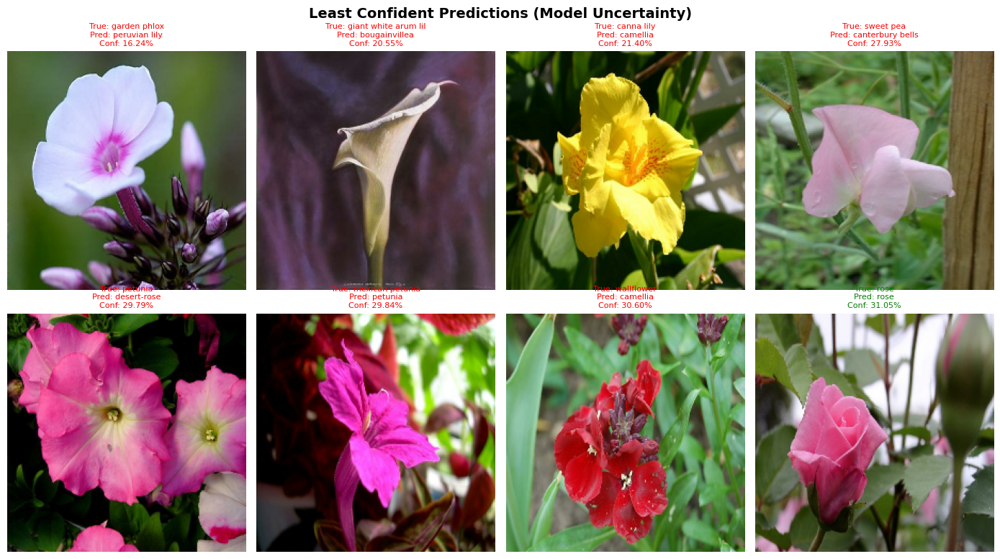


These images had the lowest confidence - model was most unsure.
Often ambiguous images or unusual viewpoints.


In [35]:
# Least confident predictions (model uncertainty)
all_confidences = y_pred_proba.max(axis=1)
least_confident_indices = np.argsort(all_confidences)[:8]

fig = plot_predictions(X_test, y_true, y_pred_classes, y_pred_proba, class_names,
                       indices=least_confident_indices, n=8,
                       title="Least Confident Predictions (Model Uncertainty)", figsize=(14, 8))
plt.savefig('outputs/vgg19_predictions_uncertain.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nThese images had the lowest confidence - model was most unsure.")
print("Often ambiguous images or unusual viewpoints.")

## Training History

Visualize the training curves from both phases (frozen backbone and fine-tuning) with annotations.

In [36]:
# Load saved training history (works for both fresh training and loaded model)
history_path = os.path.join(MODELS_DIR, 'vgg19_history.json')

# Check if saved_history already exists (from Load Saved Model cell)
if 'saved_history' not in dir() or saved_history is None:
    try:
        with open(history_path, 'r') as f:
            saved_history = json.load(f)
        print("Loaded training history from saved file")
    except FileNotFoundError:
        # Use current training history if file doesn't exist
        print("Using current training history from this session")
        saved_history = {
            'phase1': history_frozen.history,
            'phase2': history_finetune.history,
            'test_accuracy': test_acc,
            'test_loss': test_loss
        }
else:
    print("Using previously loaded training history")

# Display summary
print(f"\nPhase 1 epochs: {len(saved_history['phase1']['accuracy'])}")
print(f"Phase 2 epochs: {len(saved_history['phase2']['accuracy'])}")
print(f"Test accuracy: {saved_history['test_accuracy']:.4f}")

Using previously loaded training history

Phase 1 epochs: 50
Phase 2 epochs: 30
Test accuracy: 0.9297


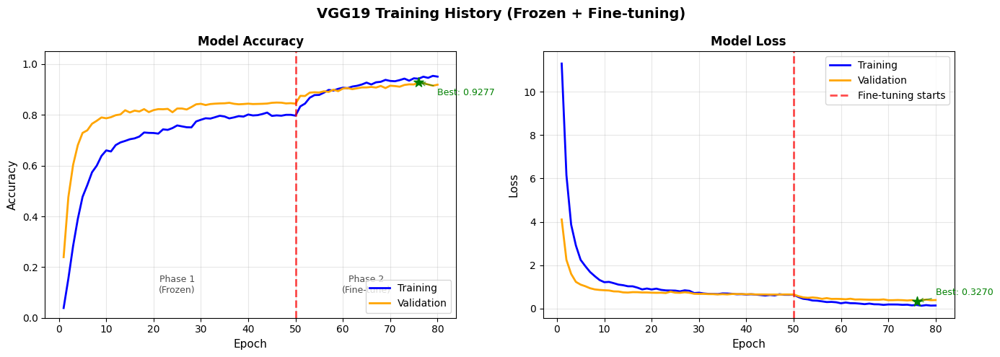


TRAINING SUMMARY
Phase 1 (Frozen backbone):
  Epochs: 50
  Best val accuracy: 0.8486

Phase 2 (Fine-tuning):
  Epochs: 30
  Best val accuracy: 0.9277

Improvement from fine-tuning: +7.91%


In [37]:
def plot_training_history_annotated(history, figsize=(14, 5)):
    """
    Plot combined training history from both phases with annotations.

    Args:
        history: Dictionary with 'phase1' and 'phase2' keys containing training metrics
        figsize: Figure size

    Returns:
        Figure object
    """
    # Combine histories
    phase1 = history['phase1']
    phase2 = history['phase2']

    combined_acc = phase1['accuracy'] + phase2['accuracy']
    combined_val_acc = phase1['val_accuracy'] + phase2['val_accuracy']
    combined_loss = phase1['loss'] + phase2['loss']
    combined_val_loss = phase1['val_loss'] + phase2['val_loss']

    phase1_epochs = len(phase1['accuracy'])
    total_epochs = len(combined_acc)
    epochs = range(1, total_epochs + 1)

    # Find best epochs
    best_val_acc_idx = np.argmax(combined_val_acc)
    best_val_acc = combined_val_acc[best_val_acc_idx]
    best_val_loss_idx = np.argmin(combined_val_loss)
    best_val_loss = combined_val_loss[best_val_loss_idx]

    fig, axes = plt.subplots(1, 2, figsize=figsize)

    # Accuracy plot
    ax = axes[0]
    ax.plot(epochs, combined_acc, 'b-', label='Training', linewidth=2)
    ax.plot(epochs, combined_val_acc, 'orange', label='Validation', linewidth=2)
    ax.axvline(x=phase1_epochs, color='red', linestyle='--', alpha=0.7, linewidth=2)

    # Annotate best validation accuracy
    ax.scatter([best_val_acc_idx + 1], [best_val_acc], color='green', s=100, zorder=5, marker='*')
    ax.annotate(f'Best: {best_val_acc:.4f}',
                xy=(best_val_acc_idx + 1, best_val_acc),
                xytext=(best_val_acc_idx + 5, best_val_acc - 0.05),
                fontsize=9, color='green',
                arrowprops=dict(arrowstyle='->', color='green', alpha=0.7))

    ax.set_xlabel('Epoch', fontsize=11)
    ax.set_ylabel('Accuracy', fontsize=11)
    ax.set_title('Model Accuracy', fontsize=12, fontweight='bold')
    ax.legend(loc='lower right')
    ax.grid(True, alpha=0.3)
    ax.set_ylim(0, 1.05)

    # Add phase labels
    ax.text(phase1_epochs/2, 0.1, 'Phase 1\n(Frozen)', ha='center', fontsize=9, alpha=0.7)
    ax.text(phase1_epochs + (total_epochs - phase1_epochs)/2, 0.1, 'Phase 2\n(Fine-tune)',
            ha='center', fontsize=9, alpha=0.7)

    # Loss plot
    ax = axes[1]
    ax.plot(epochs, combined_loss, 'b-', label='Training', linewidth=2)
    ax.plot(epochs, combined_val_loss, 'orange', label='Validation', linewidth=2)
    ax.axvline(x=phase1_epochs, color='red', linestyle='--', label='Fine-tuning starts', alpha=0.7, linewidth=2)

    # Annotate best validation loss
    ax.scatter([best_val_loss_idx + 1], [best_val_loss], color='green', s=100, zorder=5, marker='*')
    ax.annotate(f'Best: {best_val_loss:.4f}',
                xy=(best_val_loss_idx + 1, best_val_loss),
                xytext=(best_val_loss_idx + 5, best_val_loss + 0.3),
                fontsize=9, color='green',
                arrowprops=dict(arrowstyle='->', color='green', alpha=0.7))

    ax.set_xlabel('Epoch', fontsize=11)
    ax.set_ylabel('Loss', fontsize=11)
    ax.set_title('Model Loss', fontsize=12, fontweight='bold')
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)

    plt.suptitle('VGG19 Training History (Frozen + Fine-tuning)', fontsize=14, fontweight='bold')
    plt.tight_layout()

    return fig

# Plot and save
fig = plot_training_history_annotated(saved_history)
plt.savefig('outputs/vgg19_training_curves.png', dpi=300, bbox_inches='tight')
plt.show()

# Print summary statistics
print("\n" + "=" * 60)
print("TRAINING SUMMARY")
print("=" * 60)
phase1 = saved_history['phase1']
phase2 = saved_history['phase2']
print(f"Phase 1 (Frozen backbone):")
print(f"  Epochs: {len(phase1['accuracy'])}")
print(f"  Best val accuracy: {max(phase1['val_accuracy']):.4f}")
print(f"\nPhase 2 (Fine-tuning):")
print(f"  Epochs: {len(phase2['accuracy'])}")
print(f"  Best val accuracy: {max(phase2['val_accuracy']):.4f}")
print(f"\nImprovement from fine-tuning: {(max(phase2['val_accuracy']) - max(phase1['val_accuracy']))*100:+.2f}%")

## Prediction Confidence

Analyze the distribution of model confidence for correct vs incorrect predictions to understand calibration.

In [38]:
def analyze_confidence(y_proba, y_true, y_pred, n_bins=10):
    """
    Analyze model confidence distribution and calibration.

    Args:
        y_proba: Prediction probabilities
        y_true: True labels
        y_pred: Predicted labels
        n_bins: Number of bins for calibration

    Returns:
        Dictionary with analysis results
    """
    # Get max confidence for each prediction
    confidences = y_proba.max(axis=1)
    correct_mask = y_true == y_pred

    correct_confidences = confidences[correct_mask]
    wrong_confidences = confidences[~correct_mask]

    # Calculate calibration (expected calibration error)
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    bin_accuracies = []
    bin_confidences = []
    bin_counts = []

    for i in range(n_bins):
        bin_mask = (confidences >= bin_boundaries[i]) & (confidences < bin_boundaries[i + 1])
        if bin_mask.sum() > 0:
            bin_acc = correct_mask[bin_mask].mean()
            bin_conf = confidences[bin_mask].mean()
            bin_count = bin_mask.sum()
        else:
            bin_acc = 0
            bin_conf = (bin_boundaries[i] + bin_boundaries[i + 1]) / 2
            bin_count = 0

        bin_accuracies.append(bin_acc)
        bin_confidences.append(bin_conf)
        bin_counts.append(bin_count)

    # Expected Calibration Error (ECE)
    total_samples = len(confidences)
    ece = sum(count / total_samples * abs(acc - conf)
              for acc, conf, count in zip(bin_accuracies, bin_confidences, bin_counts))

    return {
        'correct_confidences': correct_confidences,
        'wrong_confidences': wrong_confidences,
        'bin_boundaries': bin_boundaries,
        'bin_accuracies': bin_accuracies,
        'bin_confidences': bin_confidences,
        'bin_counts': bin_counts,
        'ece': ece
    }

# Analyze confidence
confidence_analysis = analyze_confidence(y_pred_proba, y_true, y_pred_classes)

print("=" * 60)
print("CONFIDENCE ANALYSIS")
print("=" * 60)
print(f"Correct predictions: {len(confidence_analysis['correct_confidences'])}")
print(f"  Mean confidence: {confidence_analysis['correct_confidences'].mean():.4f}")
print(f"  Std confidence: {confidence_analysis['correct_confidences'].std():.4f}")
print(f"\nWrong predictions: {len(confidence_analysis['wrong_confidences'])}")
if len(confidence_analysis['wrong_confidences']) > 0:
    print(f"  Mean confidence: {confidence_analysis['wrong_confidences'].mean():.4f}")
    print(f"  Std confidence: {confidence_analysis['wrong_confidences'].std():.4f}")
print(f"\nExpected Calibration Error (ECE): {confidence_analysis['ece']:.4f}")

CONFIDENCE ANALYSIS
Correct predictions: 1904
  Mean confidence: 0.9749
  Std confidence: 0.0854

Wrong predictions: 144
  Mean confidence: 0.7077
  Std confidence: 0.2196

Expected Calibration Error (ECE): 0.0264


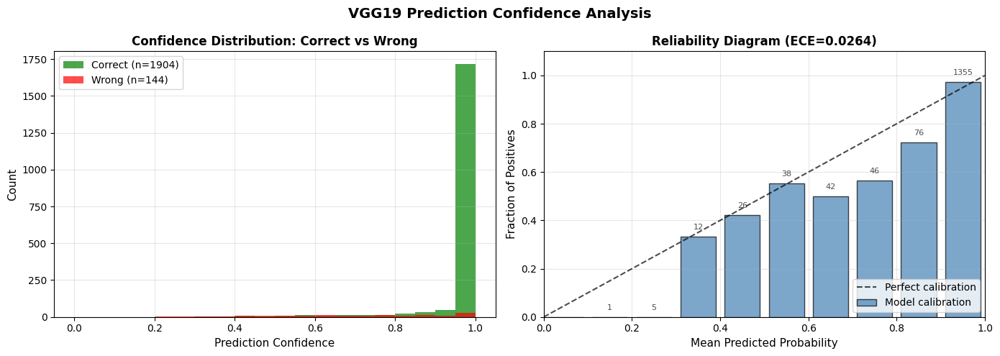


Saved to outputs/vgg19_confidence_distribution.png


In [39]:
# Plot confidence distributions
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram of confidence for correct vs wrong
ax = axes[0]
bins = np.linspace(0, 1, 21)

if len(confidence_analysis['correct_confidences']) > 0:
    ax.hist(confidence_analysis['correct_confidences'], bins=bins, alpha=0.7,
            label=f"Correct (n={len(confidence_analysis['correct_confidences'])})", color='green')
if len(confidence_analysis['wrong_confidences']) > 0:
    ax.hist(confidence_analysis['wrong_confidences'], bins=bins, alpha=0.7,
            label=f"Wrong (n={len(confidence_analysis['wrong_confidences'])})", color='red')

ax.set_xlabel('Prediction Confidence', fontsize=11)
ax.set_ylabel('Count', fontsize=11)
ax.set_title('Confidence Distribution: Correct vs Wrong', fontsize=12, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

# Reliability diagram (calibration)
ax = axes[1]
bin_centers = [(confidence_analysis['bin_boundaries'][i] + confidence_analysis['bin_boundaries'][i+1])/2
               for i in range(len(confidence_analysis['bin_accuracies']))]

# Plot perfect calibration line
ax.plot([0, 1], [0, 1], 'k--', label='Perfect calibration', alpha=0.7)

# Plot actual calibration
ax.bar(bin_centers, confidence_analysis['bin_accuracies'], width=0.08, alpha=0.7,
       label='Model calibration', color='steelblue', edgecolor='black')

# Add sample counts as text
for i, (center, count) in enumerate(zip(bin_centers, confidence_analysis['bin_counts'])):
    if count > 0:
        ax.text(center, confidence_analysis['bin_accuracies'][i] + 0.03,
                str(count), ha='center', fontsize=8, alpha=0.7)

ax.set_xlabel('Mean Predicted Probability', fontsize=11)
ax.set_ylabel('Fraction of Positives', fontsize=11)
ax.set_title(f'Reliability Diagram (ECE={confidence_analysis["ece"]:.4f})', fontsize=12, fontweight='bold')
ax.legend(loc='lower right')
ax.set_xlim(0, 1)
ax.set_ylim(0, 1.1)
ax.grid(True, alpha=0.3)

plt.suptitle('VGG19 Prediction Confidence Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/vgg19_confidence_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nSaved to outputs/vgg19_confidence_distribution.png")

**Calibration Analysis:**

- **Expected Calibration Error (ECE):** Lower is better. ECE measures the gap between confidence and actual accuracy.
- **Well-calibrated model:** When the model says 90% confident, it should be correct ~90% of the time.
- **Overconfident model:** High confidence but lower actual accuracy (bars below the diagonal).
- **Underconfident model:** Low confidence but higher actual accuracy (bars above the diagonal).

## Feature Analysis

Visualize the learned feature space using t-SNE dimensionality reduction to show how the model clusters different flower classes.

In [40]:
from sklearn.manifold import TSNE

# Create feature extraction model (output before classification layer)
# The model is: Input -> VGG19 preprocess -> VGG19 base -> GAP -> Dropout -> Dense
# We want features after GAP (before Dropout)

# Find the GlobalAveragePooling2D layer
feature_layer_name = None
for i, layer in enumerate(model.layers):
    if 'global_average_pooling' in layer.name.lower():
        feature_layer_name = layer.name
        break

if feature_layer_name:
    print(f"Found feature layer: {feature_layer_name}")
    feature_model = keras.Model(
        inputs=model.input,
        outputs=model.get_layer(feature_layer_name).output
    )
else:
    # Fallback: use layer before last Dense
    print("Using layer before classification head")
    feature_model = keras.Model(
        inputs=model.input,
        outputs=model.layers[-3].output
    )

print(f"Feature model output shape: {feature_model.output_shape}")

Found feature layer: global_average_pooling2d
Feature model output shape: (None, 512)


In [41]:
# Extract features for test set
print("Extracting features for t-SNE visualization...")
features = feature_model.predict(test_ds, verbose=1)
print(f"Features shape: {features.shape}")

# Select subset of classes for clearer visualization
# 102 classes is too dense, so we'll show a subset
np.random.seed(RANDOM_SEED)
n_classes_to_show = 15
selected_classes = np.random.choice(NUM_CLASSES, size=n_classes_to_show, replace=False)

# Filter to selected classes
mask = np.isin(y_true, selected_classes)
features_subset = features[mask]
labels_subset = y_true[mask]

print(f"\nSubset for visualization:")
print(f"  Classes: {n_classes_to_show}")
print(f"  Samples: {len(labels_subset)}")

Extracting features for t-SNE visualization...
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step
Features shape: (2048, 512)

Subset for visualization:
  Classes: 15
  Samples: 343


In [42]:
# Run t-SNE on the subset
print("Running t-SNE (this may take a minute)...")

tsne = TSNE(
    n_components=2,
    perplexity=min(30, len(features_subset) - 1),
    random_state=RANDOM_SEED,
    n_iter=1000,
    verbose=1
)

features_2d = tsne.fit_transform(features_subset)
print(f"t-SNE complete. Output shape: {features_2d.shape}")

Running t-SNE (this may take a minute)...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 343 samples in 0.000s...
[t-SNE] Computed neighbors for 343 samples in 0.082s...
[t-SNE] Computed conditional probabilities for sample 343 / 343
[t-SNE] Mean sigma: 31.535797


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.266075
[t-SNE] KL divergence after 1000 iterations: 0.554347
t-SNE complete. Output shape: (343, 2)


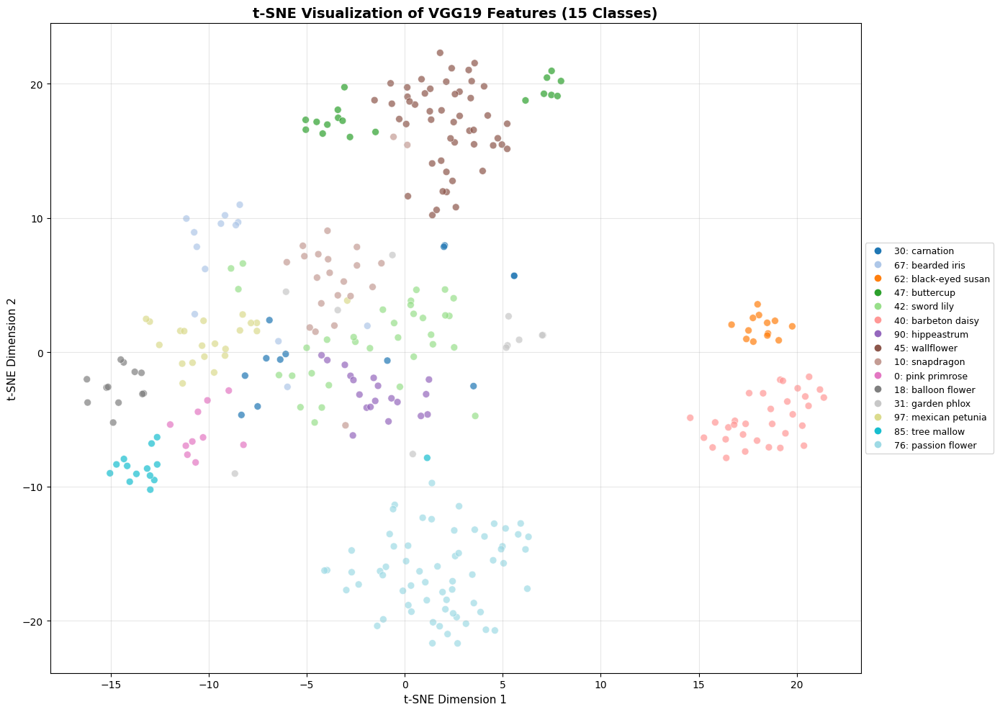


Saved to outputs/vgg19_feature_tsne.png

Note: Points of the same color (class) should cluster together,
indicating the model has learned discriminative features.


In [43]:
# Plot t-SNE visualization
fig, ax = plt.subplots(figsize=(14, 10))

# Create color map for selected classes
colors = plt.cm.tab20(np.linspace(0, 1, n_classes_to_show))
class_to_color = {cls: colors[i] for i, cls in enumerate(selected_classes)}

# Map labels to colors
point_colors = [class_to_color[label] for label in labels_subset]

# Scatter plot
scatter = ax.scatter(
    features_2d[:, 0],
    features_2d[:, 1],
    c=point_colors,
    s=50,
    alpha=0.7,
    edgecolors='white',
    linewidths=0.5
)

# Create legend with class names
handles = []
for i, cls in enumerate(selected_classes):
    handles.append(plt.Line2D([0], [0], marker='o', color='w',
                              markerfacecolor=colors[i], markersize=8,
                              label=f"{cls}: {class_names[cls][:20]}"))

ax.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=9)

ax.set_xlabel('t-SNE Dimension 1', fontsize=11)
ax.set_ylabel('t-SNE Dimension 2', fontsize=11)
ax.set_title(f't-SNE Visualization of VGG19 Features ({n_classes_to_show} Classes)',
             fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('outputs/vgg19_feature_tsne.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nSaved to outputs/vgg19_feature_tsne.png")
print("\nNote: Points of the same color (class) should cluster together,")
print("indicating the model has learned discriminative features.")

## Summary Statistics

Compile key model metrics into a table suitable for the LaTeX report.

In [44]:
# Calculate model statistics
total_params = model.count_params()

# Count trainable parameters in each phase
# Phase 1: only classification head (last Dense + Dropout)
phase1_trainable = sum([tf.reduce_prod(v.shape).numpy() for v in model.layers[-1].trainable_weights])

# Phase 2: unfrozen + classification head
current_trainable = sum([tf.reduce_prod(v.shape).numpy() for v in model.trainable_variables])

# Get training epochs and metrics from history
phase1_epochs = len(saved_history['phase1']['accuracy'])
phase2_epochs = len(saved_history['phase2']['accuracy'])
best_val_acc_phase1 = max(saved_history['phase1']['val_accuracy'])
best_val_acc_phase2 = max(saved_history['phase2']['val_accuracy'])
test_accuracy = saved_history['test_accuracy']

# Create summary DataFrame
summary_data = {
    'Metric': [
        'Model Architecture',
        'Total Parameters',
        'Trainable Parameters (Phase 1)',
        'Trainable Parameters (Phase 2)',
        'Phase 1 Epochs',
        'Phase 2 Epochs',
        'Total Epochs',
        'Best Val Accuracy (Phase 1)',
        'Best Val Accuracy (Phase 2)',
        'Test Accuracy',
        'Number of Classes',
        'Input Size',
        'Optimizer (Phase 1)',
        'Optimizer (Phase 2)',
        'Loss Function'
    ],
    'Value': [
        'VGG19 + GAP + Dropout + Dense',
        f'{total_params:,}',
        f'{phase1_trainable:,}',
        f'{current_trainable:,}',
        str(phase1_epochs),
        str(phase2_epochs),
        str(phase1_epochs + phase2_epochs),
        f'{best_val_acc_phase1:.4f} ({best_val_acc_phase1*100:.2f}%)',
        f'{best_val_acc_phase2:.4f} ({best_val_acc_phase2*100:.2f}%)',
        f'{test_accuracy:.4f} ({test_accuracy*100:.2f}%)',
        str(NUM_CLASSES),
        f'{IMG_SIZE[0]}x{IMG_SIZE[1]}',
        'Adam (lr=1e-3)',
        'Adam (lr=1e-5)',
        'Sparse Categorical Crossentropy'
    ]
}

summary_df = pd.DataFrame(summary_data)

print("=" * 60)
print("VGG19 MODEL SUMMARY")
print("=" * 60)
print(summary_df.to_string(index=False))

VGG19 MODEL SUMMARY
                        Metric                           Value
            Model Architecture   VGG19 + GAP + Dropout + Dense
              Total Parameters                      20,076,710
Trainable Parameters (Phase 1)                          52,326
Trainable Parameters (Phase 2)                       7,131,750
                Phase 1 Epochs                              50
                Phase 2 Epochs                              30
                  Total Epochs                              80
   Best Val Accuracy (Phase 1)                 0.8486 (84.86%)
   Best Val Accuracy (Phase 2)                 0.9277 (92.77%)
                 Test Accuracy                 0.9297 (92.97%)
             Number of Classes                             102
                    Input Size                         224x224
           Optimizer (Phase 1)                  Adam (lr=1e-3)
           Optimizer (Phase 2)                  Adam (lr=1e-5)
                 Loss Function Spar

In [45]:
# Export summary to CSV for LaTeX
summary_df.to_csv('outputs/vgg19_summary.csv', index=False)
print("Summary exported to outputs/vgg19_summary.csv")

# Also create a more compact version for comparison table
comparison_data = {
    'model': 'VGG19',
    'total_params': total_params,
    'trainable_phase1': phase1_trainable,
    'trainable_phase2': current_trainable,
    'epochs': phase1_epochs + phase2_epochs,
    'val_acc_phase1': best_val_acc_phase1,
    'val_acc_phase2': best_val_acc_phase2,
    'test_acc': test_accuracy,
    'ece': confidence_analysis['ece']
}

comparison_df = pd.DataFrame([comparison_data])
comparison_df.to_csv('outputs/vgg19_comparison.csv', index=False)
print("Comparison data exported to outputs/vgg19_comparison.csv")

# Display as formatted table
print("\n" + "=" * 60)
print("KEY METRICS FOR REPORT")
print("=" * 60)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")
print(f"Total Parameters: {total_params/1e6:.1f}M")
print(f"Fine-tuning Improvement: {(best_val_acc_phase2 - best_val_acc_phase1)*100:+.2f}%")
print(f"Calibration (ECE): {confidence_analysis['ece']:.4f}")

Summary exported to outputs/vgg19_summary.csv
Comparison data exported to outputs/vgg19_comparison.csv

KEY METRICS FOR REPORT
Test Accuracy: 92.97%
Total Parameters: 20.1M
Fine-tuning Improvement: +7.91%
Calibration (ECE): 0.0264


## Export for Report

Verify all output files and provide LaTeX snippets for inclusion in the final report.

In [46]:
# List all output files
print("=" * 60)
print("OUTPUT FILES FOR LATEX REPORT")
print("=" * 60)

expected_files = [
    'outputs/vgg19_confusion_matrix.png',
    'outputs/vgg19_per_class_accuracy.png',
    'outputs/vgg19_predictions_random.png',
    'outputs/vgg19_predictions_confident_correct.png',
    'outputs/vgg19_predictions_confident_wrong.png',
    'outputs/vgg19_predictions_uncertain.png',
    'outputs/vgg19_training_curves.png',
    'outputs/vgg19_confidence_distribution.png',
    'outputs/vgg19_feature_tsne.png',
    'outputs/vgg19_summary.csv',
    'outputs/vgg19_comparison.csv'
]

print("\nVerifying output files:")
all_exist = True
for filepath in expected_files:
    if os.path.exists(filepath):
        size_kb = os.path.getsize(filepath) / 1024
        print(f"  [OK] {filepath} ({size_kb:.1f} KB)")
    else:
        print(f"  [MISSING] {filepath}")
        all_exist = False

if all_exist:
    print("\n[PASS] All output files generated successfully!")
else:
    print("\n[WARNING] Some files are missing")

OUTPUT FILES FOR LATEX REPORT

Verifying output files:
  [OK] outputs/vgg19_confusion_matrix.png (385.7 KB)
  [OK] outputs/vgg19_per_class_accuracy.png (149.2 KB)
  [OK] outputs/vgg19_predictions_random.png (2644.4 KB)
  [OK] outputs/vgg19_predictions_confident_correct.png (1376.4 KB)
  [OK] outputs/vgg19_predictions_confident_wrong.png (1402.9 KB)
  [OK] outputs/vgg19_predictions_uncertain.png (1243.6 KB)
  [OK] outputs/vgg19_training_curves.png (237.5 KB)
  [OK] outputs/vgg19_confidence_distribution.png (241.7 KB)
  [OK] outputs/vgg19_feature_tsne.png (523.4 KB)
  [OK] outputs/vgg19_summary.csv (0.5 KB)
  [OK] outputs/vgg19_comparison.csv (0.2 KB)

[PASS] All output files generated successfully!


### LaTeX Include Snippets

Use these snippets to include figures in your LaTeX report:

```latex
% VGG19 Training Curves
\begin{figure}[h]
    \centering
    \includegraphics[width=\textwidth]{outputs/vgg19_training_curves.png}
    \caption{VGG19 training history showing accuracy and loss for both frozen backbone (Phase 1) and fine-tuning (Phase 2) phases.}
    \label{fig:vgg19_training}
\end{figure}

% VGG19 Confusion Matrix
\begin{figure}[h]
    \centering
    \includegraphics[width=0.8\textwidth]{outputs/vgg19_confusion_matrix.png}
    \caption{Normalized confusion matrix for VGG19 on the test set (102 classes).}
    \label{fig:vgg19_confusion}
\end{figure}

% VGG19 Per-Class Accuracy
\begin{figure}[h]
    \centering
    \includegraphics[width=\textwidth]{outputs/vgg19_per_class_accuracy.png}
    \caption{Per-class accuracy for VGG19, sorted ascending. Red dashed line shows 70\% threshold.}
    \label{fig:vgg19_perclass}
\end{figure}

% VGG19 Sample Predictions
\begin{figure}[h]
    \centering
    \includegraphics[width=\textwidth]{outputs/vgg19_predictions_random.png}
    \caption{Random sample of VGG19 predictions. Green titles indicate correct predictions, red indicate errors.}
    \label{fig:vgg19_predictions}
\end{figure}

% VGG19 Confidence Analysis
\begin{figure}[h]
    \centering
    \includegraphics[width=\textwidth]{outputs/vgg19_confidence_distribution.png}
    \caption{VGG19 prediction confidence analysis: (left) distribution for correct vs incorrect predictions, (right) reliability diagram showing calibration.}
    \label{fig:vgg19_confidence}
\end{figure}

% VGG19 Feature t-SNE
\begin{figure}[h]
    \centering
    \includegraphics[width=0.9\textwidth]{outputs/vgg19_feature_tsne.png}
    \caption{t-SNE visualization of VGG19 learned features for 15 randomly selected flower classes.}
    \label{fig:vgg19_tsne}
\end{figure}
```

In [47]:
# Final summary
print("=" * 60)
print("VGG19 EVALUATION COMPLETE")
print("=" * 60)

print(f"\n📊 MODEL PERFORMANCE:")
print(f"   Test Accuracy: {test_accuracy*100:.2f}%")
print(f"   Requirement: >70% ✓" if test_accuracy >= 0.70 else f"   Requirement: >70% ✗")

print(f"\n📈 TRAINING:")
print(f"   Total Epochs: {phase1_epochs + phase2_epochs}")
print(f"   Phase 1 Best Val: {best_val_acc_phase1*100:.2f}%")
print(f"   Phase 2 Best Val: {best_val_acc_phase2*100:.2f}%")

print(f"\n📁 OUTPUT FILES: {len(expected_files)} files in outputs/")

print(f"\n🎯 KEY FINDINGS:")
print(f"   - Fine-tuning improved accuracy by {(best_val_acc_phase2 - best_val_acc_phase1)*100:+.2f}%")
print(f"   - Model calibration (ECE): {confidence_analysis['ece']:.4f}")
print(f"   - Classes with 100% accuracy: {(per_class_df['accuracy'] == 1.0).sum()}")
print(f"   - Classes with <50% accuracy: {(per_class_df['accuracy'] < 0.5).sum()}")

print("\n" + "=" * 60)
print("Ready for next phase (YOLOv5 Backbone)")
print("=" * 60)

VGG19 EVALUATION COMPLETE

📊 MODEL PERFORMANCE:
   Test Accuracy: 92.97%
   Requirement: >70% ✓

📈 TRAINING:
   Total Epochs: 80
   Phase 1 Best Val: 84.86%
   Phase 2 Best Val: 92.77%

📁 OUTPUT FILES: 11 files in outputs/

🎯 KEY FINDINGS:
   - Fine-tuning improved accuracy by +7.91%
   - Model calibration (ECE): 0.0264
   - Classes with 100% accuracy: 42
   - Classes with <50% accuracy: 0

Ready for next phase (YOLOv5 Backbone)
